# US Traffic Accidents Severity Analysis & Prediction

# Group 7 Final Capstone Project
* [**Dataset**](https://www.kaggle.com/sobhanmoosavi/us-accidents)

# Table of Content
1. [Data Overview](#1)
    * [1. Load Data](#1.1)
    * [2. Data Type](#1.2)
    * [3. Statistical View](#1.3)
    * [4. Data Categorization](#1.4)
2. [Data Preprocessing](#2)
    * [1. Drop irrelevant columns](#2.1)
    * [2. Drop the column with Missing Value(>40%)](#2.2)
    * [3. Data type correcting](#2.3)
    * [4. Data Imputation](#2.4)
        * [1. Drop all NaN/NA/null](#2.4.1)
        * [2. Median imputation](#2.4.2)
        * [3. Mean imputation](#2.4.3)
3. [Data Analysis](#3)
    * [1. Basic Analysis](#3.1)
        * [1. What is the distribution of accidents severity?](#3.1.1)
        * [2. What is the relationship between distance and severity?](#3.1.2)
    * [2. Location Analysis](#3.2)
        * [1. What are the top 10 states with the most accidents?](#3.2.1)
        * [2. What are the top 10 cities with the most  accidents?](#3.2.3)
        * [3. What are the accidents distribution by street Side?](#3.2.6)
    * [3. Time Analysis](#3.3)
        * [1. Accidents yearly change](#3.3.1)
        * [2. Accidents monthly change](#3.3.2)
        * [3. Accidents weekly change](#3.3.3)
        * [4. Accidents hourly change](#3.3.4)
        * [5. Duration and Severity](#3.3.5)
    * [4. Environment Analysis](#3.4)
        * [1. Top 15 Wind_Direction](#3.4.2)
        * [2. Environment Attribute(numerical) distribution and the relationship with Severity](#3.4.3)
        * [3. Accidents distribution by Sunrise && Sunset](#3.4.4)
    * [5. Infrastructure Analysis](#3.5)
4. [Feature Engineering](#4)
    * [1. Feature Choosing](#4.1)
    * [2. One Hot Encoding](#4.2)
    * [3. Label Encoding](#4.3)
5. [Modelling](#5)
    * [1. Workflow Demonstration](#5.1)
        * [1.Severity Prediction](#5.1.2)
            * [1. Decision Tree](#5.1.2.3)
            * [2. Gradient Boosting Tree](#5.1.2.4)
            * [3. Random Forest](#5.1.2.5)
            * [4. XGBoost](#5.1.2.6)
            * [5. Model Comparison](#5.1.2.8)
            * [6. Deal with imbalance data](#5.1.2.9)
            * [7. Severity Prediction Visualization](#5.1.2.10)
    * [2. Severity Prediction](#5.3)
        * [1. Parameter Turning](#5.3.1)
        * [2. Model Comparison](#5.3.2)
6. [Conclusion](#6)        
7. [Explainable AI](#7)


<a id="1"></a>
# 1. Data Overview

In [146]:
# Import packages

## Basic data processing
import numpy as np
import pandas as pd

## Data Visualization
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
#for map
import folium
import folium.plugins

## Modelling
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split, ShuffleSplit, cross_val_score, GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score, plot_confusion_matrix, roc_auc_score, balanced_accuracy_score, mean_squared_error, r2_score
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor, export_graphviz, plot_tree
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor, GradientBoostingClassifier, GradientBoostingRegressor
from xgboost.sklearn import XGBClassifier, XGBRegressor

## Model Explanatory
import eli5
from pdpbox import pdp, get_dataset, info_plots

## Settings
pd.set_option('display.max_columns', 500) # Able to display more columns.

<a id="1.1"></a>
## 1.1. Load Data

In [173]:
# Load the dataset
data_df = pd.read_csv("US_Accidents_Dec20_Updated.csv")
data_df.info() # show entries, dtypes, memory useage.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1516064 entries, 0 to 1516063
Data columns (total 47 columns):
 #   Column                 Non-Null Count    Dtype  
---  ------                 --------------    -----  
 0   ID                     1516064 non-null  object 
 1   Severity               1516064 non-null  int64  
 2   Start_Time             1516064 non-null  object 
 3   End_Time               1516064 non-null  object 
 4   Start_Lat              1516064 non-null  float64
 5   Start_Lng              1516064 non-null  float64
 6   End_Lat                1516064 non-null  float64
 7   End_Lng                1516064 non-null  float64
 8   Distance(mi)           1516064 non-null  float64
 9   Description            1516064 non-null  object 
 10  Number                 469969 non-null   float64
 11  Street                 1516064 non-null  object 
 12  Side                   1516064 non-null  object 
 13  City                   1515981 non-null  object 
 14  County            

The dataset has **1516064** entries and **46** features + **1** target variable. Automatic Type Recognition: 13 of them are bool type, 13 of them are float64, 1 of them is int64, 20 of them are object. Memory usage: ** 412.1+ MB**.

In [174]:
# Glipmse of the dataset
data_df.head(5)

,ID,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,Number,Street,Side,City,County,State,Zipcode,Country,Timezone,Airport_Code,Weather_Timestamp,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Direction,Wind_Speed(mph),Precipitation(in),Weather_Condition,Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-2716600,3,2016-02-08 00:37:08,2016-02-08 06:37:08,40.10891,-83.09286,40.11206,-83.03187,3.230,Between Sawmill Rd/Exit 20 and OH-315/Olentang...,NaN,Outerbelt E,R,Dublin,Franklin,OH,43017,US,US/Eastern,KOSU,2016-02-08 00:53:00,42.1,36.1,58.0,29.76,10.0,SW,10.4,0.00,Light Rain,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Night,Night
1,A-2716601,2,2016-02-08 05:56:20,2016-02-08 11:56:20,39.86542,-84.06280,39.86501,-84.04873,0.747,At OH-4/OH-235/Exit 41 - Accident.,NaN,I-70 E,R,Dayton,Montgomery,OH,45424,US,US/Eastern,KFFO,2016-02-08 05:58:00,36.9,NaN,91.0,29.68,10.0,Calm,NaN,0.02,Light Rain,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Night,Night
2,A-2716602,2,2016-02-08 06:15:39,2016-02-08 12:15:39,39.10266,-84.52468,39.10209,-84.52396,0.055,At I-71/US-50/Exit 1 - Accident.,NaN,I-75 S,R,Cincinnati,Hamilton,OH,45203,US,US/Eastern,KLUK,2016-02-08 05:53:00,36.0,NaN,97.0,29.70,10.0,Calm,NaN,0.02,Overcast,False,False,False,False,True,False,False,False,False,False,False,False,False,Night,Night,Night,Day
3,A-2716603,2,2016-02-08 06:15:39,2016-02-08 12:15:39,39.10148,-84.52341,39.09841,-84.52241,0.219,At I-71/US-50/Exit 1 - Accident.,NaN,US-50 E,R,Cincinnati,Hamilton,OH,45202,US,US/Eastern,KLUK,2016-02-08 05:53:00,36.0,NaN,97.0,29.70,10.0,Calm,NaN,0.02,Overcast,False,False,False,False,True,False,False,False,False,False,False,False,False,Night,Night,Night,Day
4,A-2716604,2,2016-02-08 06:51:45,2016-02-08 12:51:45,41.06213,-81.53784,41.06217,-81.53547,0.123,At Dart Ave/Exit 21 - Accident.,NaN,I-77 N,R,Akron,Summit,OH,44311,US,US/Eastern,KAKR,2016-02-08 06:54:00,39.0,NaN,55.0,29.65,10.0,Calm,NaN,NaN,Overcast,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Day,Day


<a id="1.4"></a>
## 1.4. Data Categorization

* **Basic info**:  'ID', 'Severity', 'Start_Time', 'End_Time', 'Distance(mi)', 'Description'

* **Location**(Geographic factor):  'Start_Lat', 'Start_Lng','End_Lat', 'End_Lng', 'Number', 'Street','Side', 'City', 'County', 'State', 'Zipcode', 'Country', 'Timezone', 'Airport_Code'
  
* **Environment**(Environmental factor):  'Weather_Timestamp', 'Temperature(F)', 'Wind_Chill(F)', 'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Direction', 'Wind_Speed(mph)', 'Precipitation(in)', 'Weather_Condition', 'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight', 'Astronomical_Twilight'
 
* **Infrastructure**(Infrastructural factor):  'Amenity', 'Bump', 'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway', 'Roundabout', 'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal', 'Turning_Loop'

In [175]:
# Category Visualization
data_category = dict(
    character=["Basic", "Location", "Environment", "Infrastructure", 'ID', 'Severity', 'Start_Time', 'End_Time', 'Distance(mi)', 'Description', 'Start_Lat', 'Start_Lng','End_Lat', 'End_Lng', 'Number', 'Street','Side', 'City', 'County', 'State', 'Zipcode', 'Country', 'Timezone', 'Airport_Code', 'Weather_Timestamp', 'Temperature(F)', 'Wind_Chill(F)', 'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Direction', 'Wind_Speed(mph)', 'Precipitation(in)', 'Weather_Condition', 'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight', 'Astronomical_Twilight', 'Amenity', 'Bump', 'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway', 'Roundabout', 'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal', 'Turning_Loop'],
    parent=["","","","","Basic", "Basic", "Basic", "Basic", "Basic", "Basic", "Location", "Location", "Location", "Location", "Location", "Location", "Location", "Location", "Location", "Location", "Location", "Location", "Location", "Location", "Environment", "Environment", "Environment", "Environment", "Environment", "Environment", "Environment", "Environment", "Environment", "Environment", "Environment", "Environment", "Environment", "Environment", "Infrastructure", "Infrastructure", "Infrastructure", "Infrastructure", "Infrastructure", "Infrastructure", "Infrastructure", "Infrastructure", "Infrastructure", "Infrastructure", "Infrastructure", "Infrastructure", "Infrastructure"],
)

category_fig =px.sunburst(
    data_category,
    names='character',
    parents='parent'
)
category_fig.update_layout(
    autosize=False,
    width=600,
    height=600,
    title={
        'text': "Data Categorizing",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
category_fig.show()

<a id="2"></a>
# 2. Data Preprocessing

<a id="2.1"></a>
## 2.1. Drop irrelevant columns

In [5]:
# Irrelevant columns
'''
ID: ID is unique and meaningless for the dataset.
Description: I don't do text mining, therefore It's useless.
Country: All the data is from US, therefore all the data is the same.
Weather_Timestamp: The timestamp of weather observation record. It's useless here.
'''
irrelavant_columns = ['ID','Description','Country','Weather_Timestamp']
data_preprocessed_df = data_df.drop(irrelavant_columns, axis=1)

<a id="2.2"></a>
## 2.2. Drop the column with Missing Value(>40%)

In [6]:
# Replace the empty data with NaN
data_preprocessed_df.replace("", float("NaN"), inplace=True)
data_preprocessed_df.replace(" ", float("NaN"), inplace=True)

# Count missing value(NaN, na, null, None) of each columns, Then transform the result to a pandas dataframe. 
count_missing_value = data_preprocessed_df.isna().sum() / data_preprocessed_df.shape[0] * 100
count_missing_value_df = pd.DataFrame(count_missing_value.sort_values(ascending=False), columns=['Missing%'])

Text(0, 0.5, 'Features')

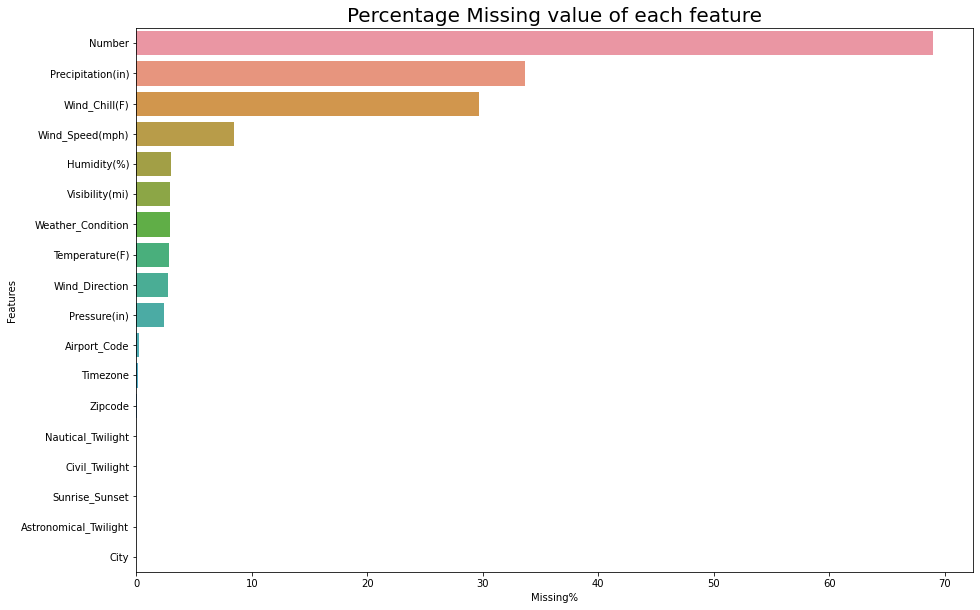

In [7]:
# Visualize the percentage(>0) of Missing value in each column.
missing_value_df = zcount_missing_value_df[count_missing_value_df['Missing%'] > 0]

plt.figure(figsize=(15, 10)) # Set the figure size
missing_value_graph = sns.barplot(y = missing_value_df.index, x = "Missing%", data=missing_value_df, orient="h")
missing_value_graph.set_title("Percentage Missing value of each feature", fontsize = 20)
missing_value_graph.set_ylabel("Features")

In [8]:
## Drop the column with Missing value(>40%)
missing_value_40_df = count_missing_value_df[count_missing_value_df['Missing%'] > 40]
data_preprocessed_df.zdrop(missing_value_40_df.index, axis=1, inplace=True)
missing_value_40_df

,Missing%
Number,69.000715


<a id="2.3"></a>
## 2.3. Data type correcting

In [9]:
# Convert Time to datetime64[ns]
data_preprocessed_df['Start_Time'] = pd.to_datetime(data_preprocessed_df['Start_Time'])
data_preprocessed_df['End_Time'] = pd.to_datetime(data_preprocessed_df['End_Time'])

In [10]:
# Display all the missing value
missing_value_df

,Missing%
Number,69.000715
Precipitation(in),33.675953
Wind_Chill(F),29.637007
Wind_Speed(mph),8.499773
Humidity(%),3.001786
Visibility(mi),2.916170
Weather_Condition,2.902714
Temperature(F),2.838469
Wind_Direction,2.760965
Pressure(in),2.392643


In [11]:
# Categorize the missing value to numerical and categorical for imputation purpose
numerical_missing = ['Wind_Speed(mph)', 'End_Lng', 'End_Lat', 'Visibility(mi)','Humidity(%)', 'Temperature(F)', 'Pressure(in)']
categorical_missing = ['Weather_Condition','Wind_Direction', 'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight', 'Astronomical_Twilight', 'Side']

<a id="2.4.1"></a>
### 2.4.1. Drop all NaN/NA/null 

In [12]:
# Drop all the instance with NaN/NA/null
data_preprocessed_dropNaN_df = z.dropna()
data_preprocessed_dropNaN_df.reset_index(drop=True, inplace=True)

<a id="2.4.2"></a>
### 2.4.2. Median imputation

In [13]:
# Imputation by corresponding class Median value 
data_preprocessed_median_df = data_preprocessed_df.copy()

# For numerical columns
for column_name in numerical_missing:
    data_preprocessed_median_df[column_name] = data_preprocessed_median_df.groupby('Severity')[column_name].transform(lambda x:x.fillna(x.median()))

# # For categorical columns(Majority value imputation)
for column_name in categorical_missing:
    data_preprocessed_median_df[column_name] = data_preprocessed_median_df.groupby('Severity')[column_name].transform(lambda x:x.fillna(x.fillna(x.mode().iloc[0])))

# Drop NaN and reset index
data_preprocessed_median_df.dropna(inplace=True)

<a id="2.4.3"></a>
### 2.4.3. Mean imputation

In [14]:
# Imputation by corresponding class Mean value 
data_preprocessed_mean_df = data_preprocessed_df.copy()

# For numerical columns
for column_name in numerical_missing:
    data_preprocessed_mean_df[column_name] = data_preprocessed_mean_df.groupby('Severity')[column_name].transform(lambda x:x.fillna(x.mean()))

# For categorical columns(Majority value imputation)
for column_name in categorical_missing:
    data_preprocessed_mean_df[column_name] = data_preprocessed_mean_df.groupby('Severity')[column_name].transform(lambda x:x.fillna(x.fillna(x.mode().iloc[0])))
    
# Drop NaN 
data_preprocessed_mean_df.dropna(inplace=True)

After Data Imputation:
* **data_preprocessed_dropNaN_df**: The dataset that simply drop all the NaN values.
* **data_preprocessed_median_df**: The dataset that use grouped median imputation for numerical data and grouped majority value imputation for categorical data.
* **data_preprocessed_mean_df**: The dataset that use grouped mean imputation for numerical data and grouped majority value imputation for categorical data.

In [15]:
# Choose the best dataset base on the performance of modeling
data_best_df = data_preprocessed_dropNaN_df.copy()
# Reset index
data_best_df.reset_index(inplace=True)

<a id="3"></a>
# 3. Data Analysis

<a id="3.1"></a>
## 3.1. Basic Analysis

<a id="3.1.1"></a>
### 3.1.1. What is the distribution of accidents severity?

In [16]:
# Count the number of each severity, transform the result to pandas dataframe
severity_counts = data_best_df["Severity"].value_counts()
severity_counts_df = pd.DataFrame(severity_counts)

# Calculate the proportion of each Severity
severity_percentage_df = severity_counts_df / sum(severity_counts_df["Severity"]) * 100

In [17]:
# Visualize the distribution of accidents severity
severity_fig = make_subplots(
    rows=1, cols=2, 
    specs=[[{"type": "xy"}, {"type": "domain"}]])

severity_fig.add_trace(go.Bar(x=severity_counts_df.index, 
                              y=severity_counts_df["Severity"],
                              text=severity_counts_df["Severity"],
                              textposition='outside',
                              showlegend=False),
                              1, 1)

severity_fig.add_trace(go.Pie(labels=severity_percentage_df.index, 
                     values=severity_percentage_df["Severity"],
                     showlegend=True),
                     1, 2)

severity_fig.update_layout(
                  height=600, 
                  width=1500,
                  title={
                  'text': "The distribution of accidents severity",
                  'font': {'size': 24},
                  'y':0.95,
                  'x':0.5,
                  'xanchor': 'center',
                  'yanchor': 'top'},
                  xaxis1_title = 'Severity',
                  yaxis1_title = 'Counts',
                  legend_title_text="Severity"
                 )
severity_fig.update_xaxes(type='category')
severity_fig.show()

As we can see from the graph, **level 2** is the most frequent severity which is 76.1% of the total. That means our target variable(label) is quite **unbalanced**.

<a id="3.1.2"></a>
### 3.1.2. What is the relationship between distance and severity?

In [18]:
# Calculate the mean distance of each Severity
mean_distance = data_best_df.groupby('Severity')["Distance(mi)"].mean().round(2)
mean_distance_df = pd.DataFrame(mean_distance)

mean_distance_fig = px.bar(mean_distance_df, 
                                   x = mean_distance_df.index, 
                                   y = "Distance(mi)", 
                                   labels={"index": "Severity"},
                                   text="Distance(mi)")
mean_distance_fig.update_layout(
    autosize=False,
    width=600,
    height=500,
    title={
        'text': "Mean Distance(mi) of each Severity",
        'y':0.95,
        'x':0.5,
        'font': {'size': 24},
        'xanchor': 'center',
        'yanchor': 'top'},
    xaxis={
        'type':'category'
    })
mean_distance_fig.show()

Generally speaking, the longer the influence distance the higher the severity level will be.

<a id="3.2"></a>
## 3.2. Location Analysis

<a id="3.2.1"></a>
### 3.2.1. What are the top 10 states with the most accidents?

In [19]:
# Overview of the US traffic accidents 
# https://plotly.com/python/choropleth-maps/
state_accidents_count = best_data["State"].value_counts()
fig = go.Figure(data=go.Choropleth(locations=state_accidents_count.index, 
                                           z=state_accidents_count.values.astype(float), 
                                           locationmode="USA-states", 
                                           colorscale="Reds",
                                           colorbar_title = "Frequency"
                                  ))
fig.update_layout(
    height=600, 
    width=1500,
    title={
        'text': "Frequency distribution of US Accidents",
        'y':0.9,
        'x':0.5,
        'font': {'size': 24},
        'xanchor': 'center',
        'yanchor': 'top'},
        geo_scope="usa")
fig.show()

In [23]:
# Top 10 States with the Most Accidents
state_accidents_count_top10 = state_accidents_count[:10]
state_accidents_count_top10_df = pd.DataFrame(state_accidents_count_top10)

state_accidents_count_top10_fig = px.bar(state_accidents_count_top10_df, 
                                         x = state_accidents_count_top10_df.index, 
                                         y = "State", 
                                         labels={"index": "State", "State": "Counts"},
                                         text="State")
state_accidents_count_top10_fig.update_layout(
    autosize=False,
    width=1000,
    height=600,
    title={
        'text': "Top 10 States with the Most Accidents",
        'y':0.95,
        'x':0.5,
        'font': {'size': 24},
        'xanchor': 'center',
        'yanchor': 'top'})
state_accidents_count_top10_fig.update_yaxes(categoryorder = "total ascending")
state_accidents_count_top10_fig.show()

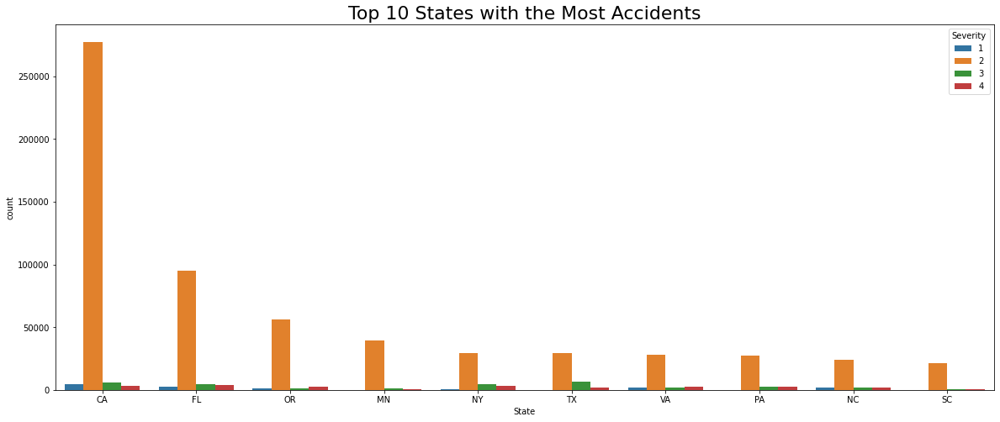

In [20]:
# Top 10 States with the Most Accidents in a view of severity 
plt.figure(figsize=(20, 8))
ax = sns.countplot(x="State", 
              data=data_best_df, 
              order=data_best_df['State'].value_counts()[:10].index, 
              hue='Severity',
              palette='tab10')
plt.title("Top 10 States with the Most Accidents", fontsize = 22)
#for p in ax.patches:
#        ax.annotate(p.get_height(), (p.get_x(), p.get_height()+1000))
plt.show()

<a id="3.2.3"></a>
### 3.2.3. What are the top 10 cities with the most accidents?

In [22]:
# Top 10 Cities with the Most Accidents
city_accidents_count = data_best_df["City"].value_counts()
city_accidents_count_top10 = city_accidents_count[:10]
city_accidents_count_top10_df = pd.DataFrame(city_accidents_count_top10)

city_accidents_count_top10_fig = px.bar(city_accidents_count_top10_df, 
                                        x = city_accidents_count_top10_df.index, 
                                        y = "City", 
                                        labels={"index": "City", "City": "Counts"},
                                        text="City")
city_accidents_count_top10_fig.update_layout(
    autosize=False,
    width=1000,
    height=600,
    title={
        'text': "Top 10 Cities with the Most Accidents",
        'y':0.95,
        'x':0.5,
        'font': {'size': 24},
        'xanchor': 'center',
        'yanchor': 'top'})
city_accidents_count_top10_fig.update_yaxes(categoryorder = "total ascending")
city_accidents_count_top10_fig.show()

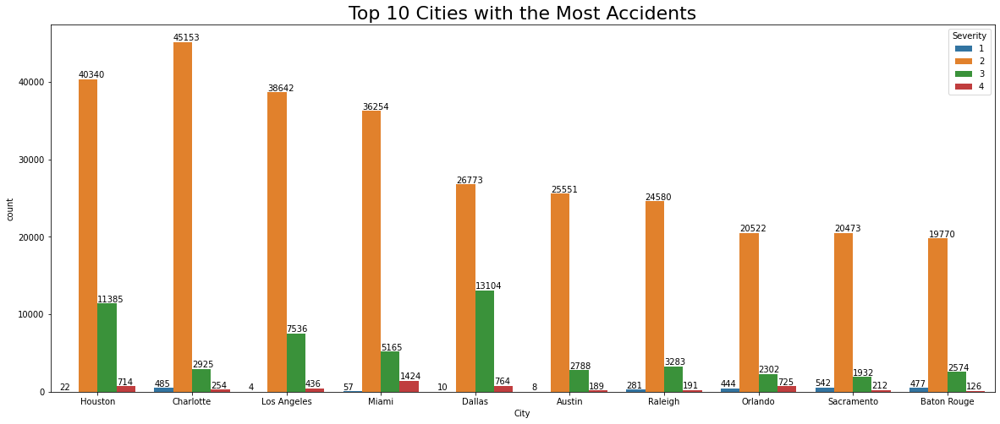

In [28]:
# Top 10 Cities with the Most Accidents in a view of severity
plt.figure(figsize=(20, 8))
ax = sns.countplot(x="City", 
                   data = data_best_df, 
                   order=data_best_df['City'].value_counts()[:10].index, 
                   hue = 'Severity')
plt.title("Top 10 Cities with the Most Accidents", fontsize = 22)
for p in ax.patches:
        ax.annotate(p.get_height(), (p.get_x(), p.get_height()+200))
plt.show()

<a id="3.2.6"></a>
### 3.2.6. What are the accidents distribution by street Side?

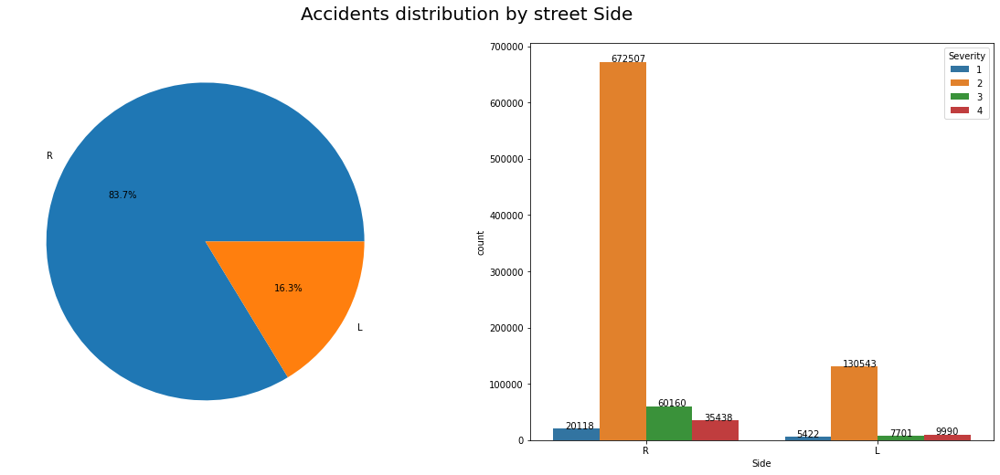

In [26]:
# Accidents distribution by street Side
# Set up the matplotlib figure
f, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 8))
# Pie chart
data_best_df["Side"].value_counts().plot.pie(autopct="%.1f%%", ylabel='', ax=axes[0])

sns.countplot(x="Side", 
              data = data_best_df, 
              order=data_best_df['Side'].value_counts().index, 
              hue = 'Severity',
             ax=axes[1])
for p in axes[1].patches:
        axes[1].annotate(p.get_height(), (p.get_x()+0.05, p.get_height()+100))

# Common title
plt.suptitle("Accidents distribution by street Side", y=0.95, fontsize=20)
plt.show()

Most of the accidents happened at the right side of the road which is quite an interesting finding.

<a id="3.3"></a>
## 3.3. Time Analysis

<a id="3.3.4"></a>
### 3.3.4. Hour

In [33]:
# Extract Hour (Weekday)
weekdays_lst = [ 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']
hour_accidents_weekdays_count = data_best_df[data_best_df['Week'].isin(weekdays_lst)]["Start_Time"].dt.hour
hour_accidents_weekdays_count_df = pd.DataFrame(hour_accidents_weekdays_count.value_counts())
hour_accidents_weekdays_count_df.sort_index(inplace=True)

hour_accidents_weekdays_count_fig = px.bar(hour_accidents_weekdays_count_df, 
                                   x = hour_accidents_weekdays_count_df.index, 
                                   y = "Start_Time", 
                                   labels={"index": "Hour", "Start_Time": "Counts"},
                                   text="Start_Time")
hour_accidents_weekdays_count_fig.update_layout(
    autosize=False,
    width=1000,
    height=500,
    title={
        'text': "Accidents hourly change(Weekdays)",
        'y':0.95,
        'x':0.5,
        'font': {'size': 24},
        'xanchor': 'center',
        'yanchor': 'top'},
    xaxis={
        'type':'category'
    })
hour_accidents_weekdays_count_fig.show()

It seems that 7:00/8:00(Go to work) and 16:00/17:00(go back home) are the time where accidents happen during a day. 

In [34]:
# Extract Hour (Weekend)
weekend_lst = ['Saturday', 'Sunday']
hour_accidents_weekend_count = data_best_df[data_best_df['Week'].isin(weekend_lst)]["Start_Time"].dt.hour
hour_accidents_weekend_count_df = pd.DataFrame(hour_accidents_weekend_count.value_counts())
hour_accidents_weekend_count_df.sort_index(inplace=True)

hour_accidents_weekend_count_fig = px.bar(hour_accidents_weekend_count_df, 
                                   x = hour_accidents_weekend_count_df.index, 
                                   y = "Start_Time", 
                                   labels={"index": "Hour", "Start_Time": "Counts"},
                                   text="Start_Time")
hour_accidents_weekend_count_fig.update_layout(
    autosize=False,
    width=1000,
    height=500,
    title={
        'text': "Accidents hourly change(Weekend)",
        'y':0.95,
        'x':0.5,
        'font': {'size': 24},
        'xanchor': 'center',
        'yanchor': 'top'},
    xaxis={
        'type':'category'
    })
hour_accidents_weekend_count_fig.show()

The peak of the weekend is during 12:00 ~ 16:00.

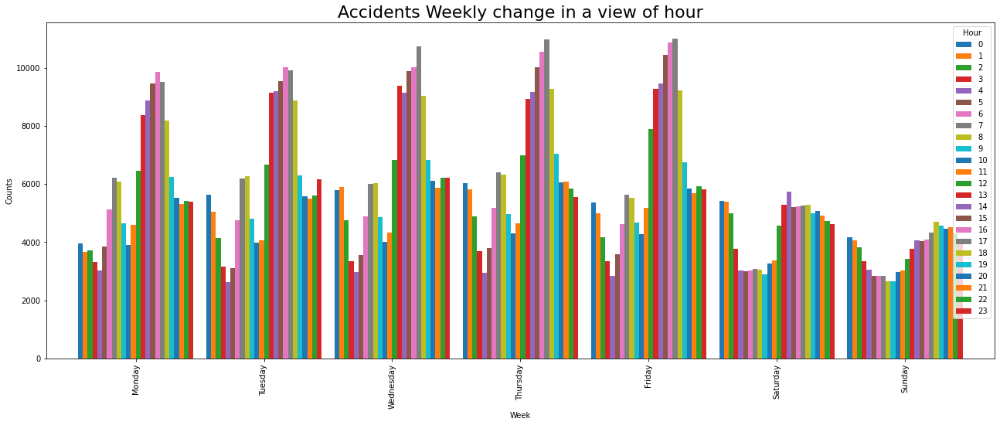

In [35]:
# Weekly view with hours
data_best_df.groupby('Week')['Hour'].value_counts().unstack().reindex(week_order).plot.bar(
    figsize=(22, 8),
    ylabel='Counts',
    width=.9
)
plt.title("Accidents Weekly change in a view of hour", fontsize = 22)
plt.show()

The decrease of the accidents number at weekends mainly because the decrease at 7:00/8:00(Go to work) and 16:00/17:00(go back home). The peak of the weekend is during 12:00 ~ 16:00.

<a id="3.4"></a>
## 3.4. Environment Analysis

Text(0, 0.5, 'Weather_Condition')

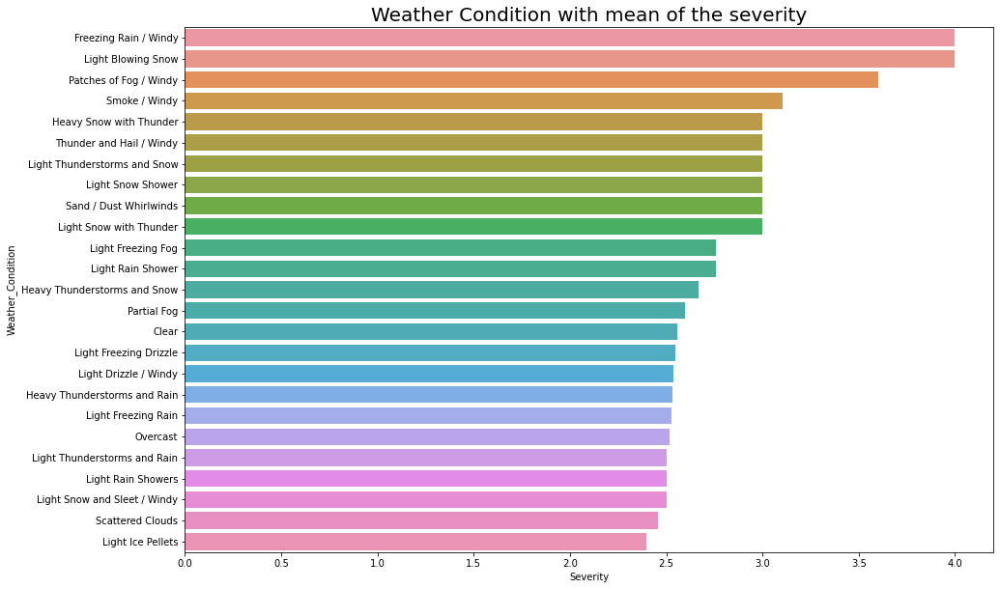

In [38]:
# Weather condition by mean of the Severity
weather_mean_severity = data_best_df.groupby('Weather_Condition')['Severity'].mean().sort_values(ascending=False)
weather_mean_severity_df = pd.DataFrame(weather_mean_severity[:25])

plt.figure(figsize=(15, 10)) # Set the figure size
weather_mean_severity_graph = sns.barplot(y = weather_mean_severity_df.index, x = "Severity", data=weather_mean_severity_df, orient="h")
weather_mean_severity_graph.set_title("Weather Condition with mean of the severity", fontsize = 20)
weather_mean_severity_graph.set_ylabel("Weather_Condition")

**Freezing rain with windy**, **light blowing Snow** and **patches of fog** with windy are the top 3 dangeous weather condition. 

Temperature(F):  lower temperature -> higher Severity  
Humidity(%):  higher humidity -> higher Severity  
Pressure(in):  lower pressure -> higher Severity  
Visibility(mi):  lower visibility -> higher Severity  
Wind_Speed(mph): higher wind speed -> higher Severity  
In summary, all the results fit with cold, chill, freezing weather condition. Eg. Freezing rain with windy, snow and so on.

<a id="3.4.4"></a>
### 3.4.4. Accidents distribution by Sunrise && Sunset

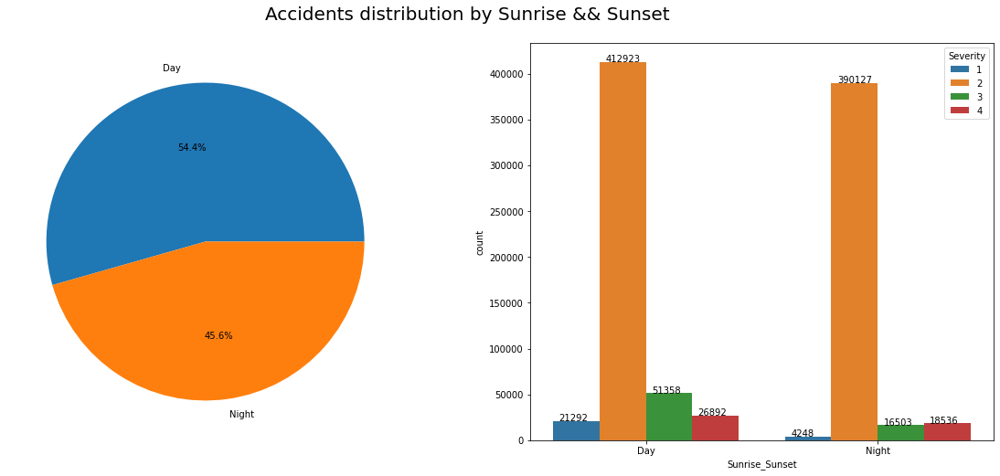

In [41]:
# Accidents distribution by Sunrise && Sunset
# Set up the matplotlib figure
f, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 8))
# Pie chart
data_best_df["Sunrise_Sunset"].value_counts().plot.pie(autopct="%.1f%%", ylabel='', ax=axes[0])

sns.countplot(x="Sunrise_Sunset", 
              data = data_best_df, 
              order=data_best_df['Sunrise_Sunset'].value_counts().index, 
              hue = 'Severity',
             ax=axes[1])
for p in axes[1].patches:
        axes[1].annotate(p.get_height(), (p.get_x()+0.025, p.get_height()+100))

# Common title
plt.suptitle("Accidents distribution by Sunrise && Sunset", y=0.95, fontsize=20)
plt.show()

Accidents mostly happened at daytime.

<a id="4"></a>
# 4. Feature Engineering

In [98]:
## Only choose a city based on the visualization because of the resources limitation.
data_best_df = data_preprocessed_dropNaN_df[data_preprocessed_dropNaN_df['City'] == 'Charlotte'].copy()

# Reset index
data_best_df.reset_index(inplace=True)

<a id="4.1"></a>
## 4.1. Feature choosing

In [106]:
# Choose relevant features
relevant_features = ['Severity', 'Start_Time', 'End_Time', 'Start_Lat', 'Start_Lng','Side',
       'Temperature(F)', 'Humidity(%)', 'Pressure(in)', 'Visibility(mi)',
       'Wind_Direction', 'Wind_Speed(mph)', 'Weather_Condition', 'Amenity',
       'Bump', 'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway',
       'Roundabout', 'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal',
       'Turning_Loop', 'Sunrise_Sunset']
data_modelling_df = data_best_df[relevant_features].copy()

In [107]:
# Duration = End_Time - Start_Time; Create a new feature for modeling.
data_modelling_df['Duration'] = (data_modelling_df['End_Time'] - data_modelling_df['Start_Time']).dt.total_seconds() / 3600
data_modelling_df.drop('End_Time', axis=1, inplace=True)

In [108]:
# Transform Month/week/Hour to different features
data_modelling_df["Month"] = data_modelling_df["Start_Time"].dt.month
data_modelling_df["Week"] = data_modelling_df["Start_Time"].dt.dayofweek
data_modelling_df["Hour"] = data_modelling_df["Start_Time"].dt.hour
data_modelling_df.drop("Start_Time", axis=1, inplace=True)

<a id="4.2"></a>
## 4.2. One Hot Encoding

In [109]:
# Select features that are suitable for One Hot Encoding
one_hot_features = ['Wind_Direction', 'Weather_Condition']

# Wind_Direction Categorizing
data_modelling_df.loc[data_modelling_df['Wind_Direction'].str.startswith('C'), 'Wind_Direction'] = 'C' #Calm
data_modelling_df.loc[data_modelling_df['Wind_Direction'].str.startswith('E'), 'Wind_Direction'] = 'E' #East, ESE, ENE
data_modelling_df.loc[data_modelling_df['Wind_Direction'].str.startswith('W'), 'Wind_Direction'] = 'W' #West, WSW, WNW
data_modelling_df.loc[data_modelling_df['Wind_Direction'].str.startswith('S'), 'Wind_Direction'] = 'S' #South, SSW, SSE
data_modelling_df.loc[data_modelling_df['Wind_Direction'].str.startswith('N'), 'Wind_Direction'] = 'N' #North, NNW, NNE
data_modelling_df.loc[data_modelling_df['Wind_Direction'].str.startswith('V'), 'Wind_Direction'] = 'V' #Variable

In [110]:
# Weather_Condition Categorizing
# Fair, Cloudy, Clear, Overcast, Snow, Haze, Rain, Thunderstorm, Windy, Hail, Thunder, Dust, Tornado
data_modelling_df['Weather_Fair'] = np.where(data_modelling_df['Weather_Condition'].str.contains('Fair', case=False, na = False), 1, 0)
data_modelling_df['Weather_Cloudy'] = np.where(data_modelling_df['Weather_Condition'].str.contains('Cloudy', case=False, na = False), 1, 0)
data_modelling_df['Weather_Clear'] = np.where(data_modelling_df['Weather_Condition'].str.contains('Clear', case=False, na = False), 1, 0)
data_modelling_df['Weather_Overcast'] = np.where(data_modelling_df['Weather_Condition'].str.contains('Overcast', case=False, na = False), 1, 0)
data_modelling_df['Weather_Snow'] = np.where(data_modelling_df['Weather_Condition'].str.contains('Snow|Wintry|Sleet', case=False, na = False), 1, 0)
data_modelling_df['Weather_Haze'] = np.where(data_modelling_df['Weather_Condition'].str.contains('Smoke|Fog|Mist|Haze', case=False, na = False), 1, 0)
data_modelling_df['Weather_Rain'] = np.where(data_modelling_df['Weather_Condition'].str.contains('Rain|Drizzle|Showers', case=False, na = False), 1, 0)
data_modelling_df['Weather_Thunderstorm'] = np.where(data_modelling_df['Weather_Condition'].str.contains('Thunderstorms|T-Storm', case=False, na = False), 1, 0)
data_modelling_df['Weather_Windy'] = np.where(data_modelling_df['Weather_Condition'].str.contains('Windy|Squalls', case=False, na = False), 1, 0)
data_modelling_df['Weather_Hail'] = np.where(data_modelling_df['Weather_Condition'].str.contains('Hail|Ice Pellets', case=False, na = False), 1, 0)
data_modelling_df['Weather_Thunder'] = np.where(data_modelling_df['Weather_Condition'].str.contains('Thunder', case=False, na = False), 1, 0)
data_modelling_df['Weather_Dust'] = np.where(data_modelling_df['Weather_Condition'].str.contains('Dust', case=False, na = False), 1, 0)
data_modelling_df['Weather_Tornado'] = np.where(data_modelling_df['Weather_Condition'].str.contains('Tornado', case=False, na = False), 1, 0)

In [111]:
# Transform the one-hot features, then delete them
onehot_df = pd.get_dummies(data_modelling_df['Wind_Direction'], prefix='Wind')
data_modelling_df = pd.concat([data_modelling_df, onehot_df], axis=1)
data_modelling_df.drop(one_hot_features, axis=1, inplace=True)

<a id="4.3"></a>
## 4.3. Label Encoding

In [112]:
# Select features that are suitable for Label Encoding
label_encoding_features = ['Side', 'Amenity','Bump', 'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway','Roundabout', 'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal','Turning_Loop', 'Sunrise_Sunset']

# Label Encoding
for feature in label_encoding_features:
    data_modelling_df[feature] = LabelEncoder().fit_transform(data_modelling_df[feature])

In [113]:
data_modelling_df

,Severity,Start_Lat,Start_Lng,Side,Temperature(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Duration,Month,Week,Hour,Weather_Fair,Weather_Cloudy,Weather_Clear,Weather_Overcast,Weather_Snow,Weather_Haze,Weather_Rain,Weather_Thunderstorm,Weather_Windy,Weather_Hail,Weather_Thunder,Weather_Dust,Weather_Tornado,Wind_C,Wind_E,Wind_N,Wind_S,Wind_V,Wind_W
0,2,35.311788,-80.969496,1,45.0,90.0,29.89,5.00,11.5,0,0,0,0,0,0,0,0,1,0,0,0,0,1,6.000000,12,1,6,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0
1,2,35.154630,-80.794820,1,45.0,90.0,29.89,5.00,11.5,0,0,1,0,0,0,0,0,0,0,0,1,0,1,6.000000,12,1,6,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0
2,2,35.154510,-80.794920,1,45.0,90.0,29.89,5.00,11.5,0,0,1,0,0,0,0,0,0,0,0,1,0,1,6.000000,12,1,6,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0
3,2,35.311506,-80.970119,1,45.0,90.0,29.89,5.00,11.5,0,0,0,0,0,0,0,0,1,0,0,0,0,1,6.000000,12,1,6,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0
4,2,35.202560,-80.726070,0,45.0,90.0,29.89,5.00,11.5,0,0,1,0,0,0,0,0,0,0,0,1,0,1,6.000000,12,1,6,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10307,2,35.195320,-80.883840,1,90.0,52.0,29.18,10.00,15.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.486389,8,3,16,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0
10308,2,35.262040,-80.967620,1,73.0,87.0,29.21,0.75,3.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.491944,8,3,17,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0
10309,4,35.184900,-80.888080,1,77.0,82.0,29.21,10.00,0.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,4.987222,8,3,18,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
10310,3,35.264430,-80.842970,1,74.0,87.0,29.24,10.00,6.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0.483333,8,4,22,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0


<a id="5"></a>
# 5. Modelling

<a id="5.1"></a>
## 5.1. Workflow Demonstration

<a id="5.1.2"></a>
### 5.1.2. Severity Prediction

In [147]:
# Train/Test Split
X_cla = data_modelling_df.drop("Severity", axis=1)
Y_cla = data_modelling_df.Severity
x_train_cla, x_test_cla, y_train_cla, y_test_cla = train_test_split(X_cla, Y_cla, test_size = 0.4, random_state=0, stratify=Y_cla)
print(f'Train Cla: {x_train_cla.shape} \n Test Cla: {x_test_cla.shape}')
cla_feature_names = x_train_cla.columns.tolist()

Train Cla: (6187, 45) 
 Test Cla: (4125, 45)


In [148]:
# normalize must be one of {'true', 'pred', 'all', None}
'''
Description: Plot the confusion matrix
Args:
    classifier: The classifier
Return: None
'''
def draw_confusion_matrix(classifier):
    fig, ax = plt.subplots(figsize=(12, 6))
    plot_confusion_matrix(classifier, x_test_cla, y_test_cla, cmap=plt.cm.Blues, normalize=None, ax=ax)
    ax.set_title("Confusion Matrix", fontsize = 15)
    plt.show()

<a id="5.1.2.3"></a>
#### 5.1.2.3. Decision Tree

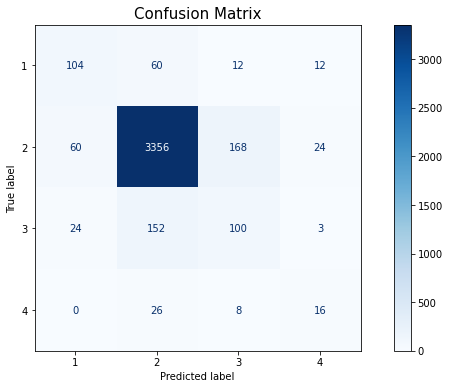

              precision    recall  f1-score   support

           1       0.55      0.55      0.55       188
           2       0.93      0.93      0.93      3608
           3       0.35      0.36      0.35       279
           4       0.29      0.32      0.30        50

    accuracy                           0.87      4125
   macro avg       0.53      0.54      0.54      4125
weighted avg       0.87      0.87      0.87      4125

balanced_accuracy: 0.5404424097682046
roc_ovo_macro: 0.693470558724398
roc_ovr_weighted: 0.7295847475566548


Weight,Feature
0.1513,Duration
0.1114,Start_Lat
0.1003,Month
0.0989,Start_Lng
0.0846,Hour
0.0768,Pressure(in)
0.0703,Humidity(%)
0.0588,Temperature(F)
0.0472,Week
0.0459,Wind_Speed(mph)


In [149]:
# Decision Tree Classification
dt_cla = DecisionTreeClassifier(random_state=0)
dt_cla.fit(x_train_cla, y_train_cla)
dt_cla_predictions = dt_cla.predict(x_test_cla)
dt_cla_results = classification_report(y_test_cla, dt_cla_predictions, zero_division=True, output_dict=True)

# Confusion matrix and Classification report
draw_confusion_matrix(dt_cla)
print(classification_report(y_test_cla, dt_cla_predictions, zero_division=True))

# balanced_accuracy
dt_cla_balanced_accuracy = balanced_accuracy_score(y_test_cla, dt_cla_predictions)
print(f'balanced_accuracy: {dt_cla_balanced_accuracy}')

# ROC_AUC score
dt_cla_roc_ovo_macro = roc_auc_score(y_test_cla, dt_cla.predict_proba(x_test_cla), multi_class='ovo', average='macro') #Insensitive to class imbalance when average == 'macro'
dt_cla_roc_ovr_weighted = roc_auc_score(y_test_cla, dt_cla.predict_proba(x_test_cla), multi_class='ovr', average='weighted') #Sensitive to class imbalance even when average == 'macro'
print(f"roc_ovo_macro: {dt_cla_roc_ovo_macro}") 
print(f"roc_ovr_weighted: {dt_cla_roc_ovr_weighted}")

# Show feature importance as a table
eli5.show_weights(dt_cla, feature_names = cla_feature_names)

Text(0, 0.5, 'Features')

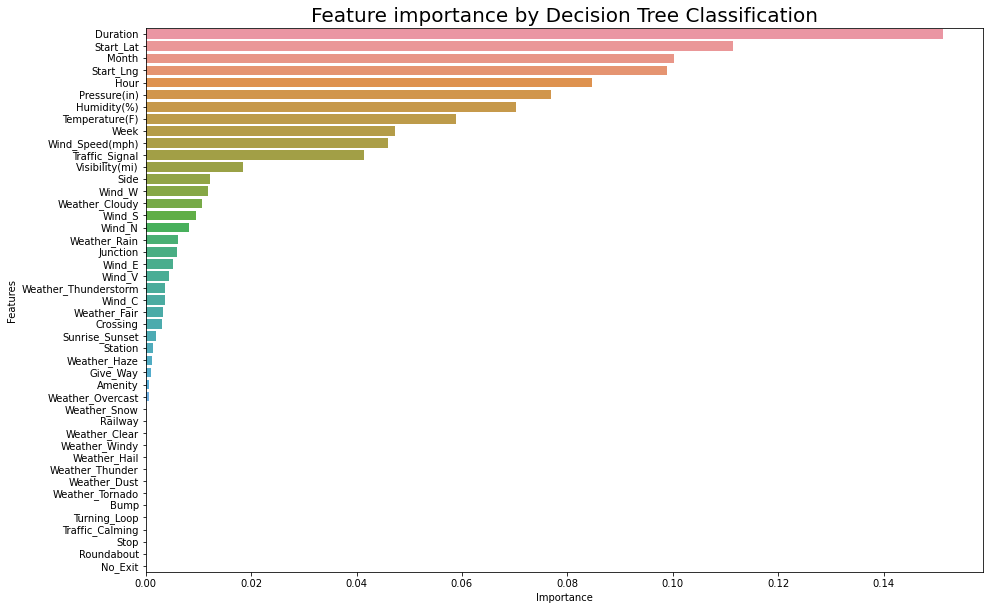

In [150]:
# Get the feature importance as a dataframe  
dt_cla_importances_df = pd.DataFrame(pd.Series(dt_cla.feature_importances_, index=X_cla.columns), columns=['Importance']).sort_values('Importance', ascending=False)
# Visualize the feature importance of the trained tree
plt.figure(figsize=(15, 10))
missing_value_graph = sns.barplot(y = dt_cla_importances_df.index, x = "Importance", data=dt_cla_importances_df, orient="h")
missing_value_graph.set_title("Feature importance by Decision Tree Classification", fontsize = 20)
missing_value_graph.set_ylabel("Features")

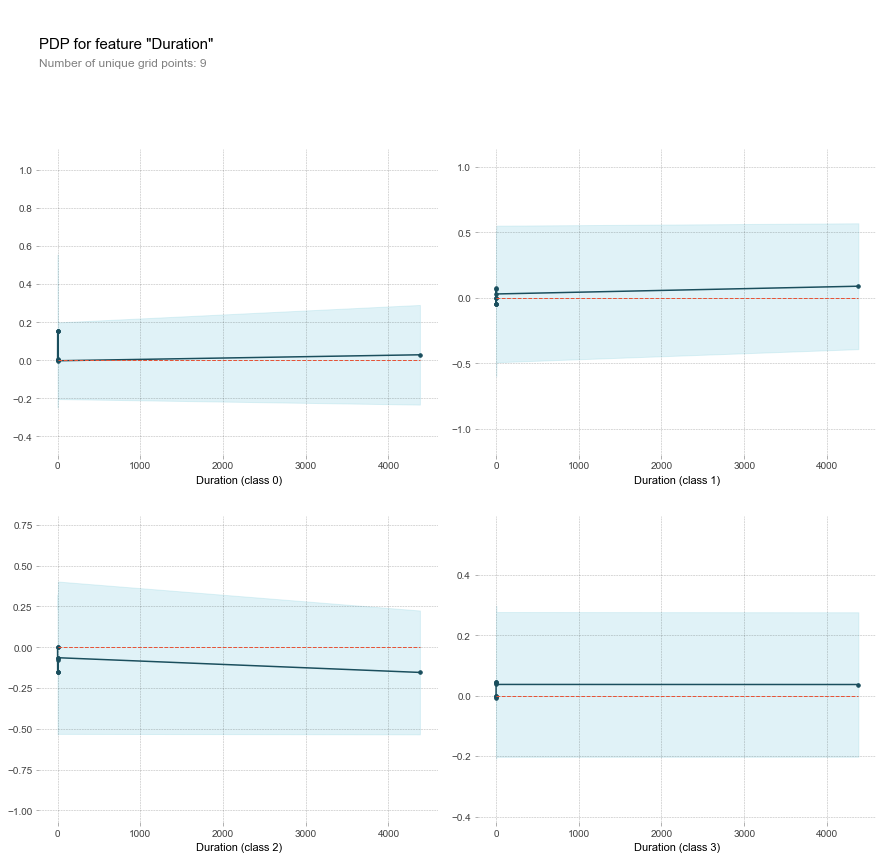

In [151]:
# 1-D pdp plot
dt_cla_pdp_goals = pdp.pdp_isolate(model=dt_cla, dataset=x_test_cla, model_features=cla_feature_names, feature='Duration')
# plot it
pdp.pdp_plot(dt_cla_pdp_goals, 'Duration')
plt.show()

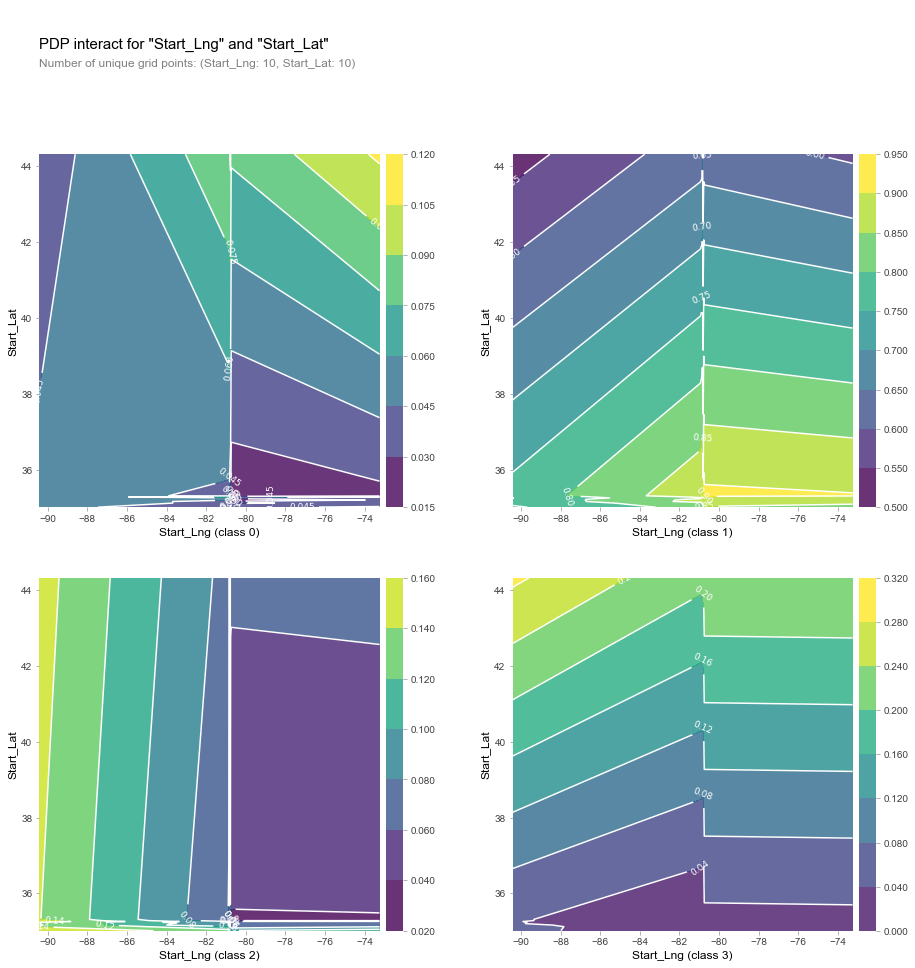

In [152]:
# 2D Partial Dependence Plots
features_to_plot = ['Start_Lng', 'Start_Lat']
dt_cla_pdp_2D = pdp.pdp_interact(model=dt_cla, dataset=x_test_cla, model_features=cla_feature_names, features=features_to_plot)
pdp.pdp_interact_plot(pdp_interact_out=dt_cla_pdp_2D, feature_names=features_to_plot, plot_type='contour')
plt.show()

<a id="5.1.2.4"></a>
#### 5.1.2.4. Gradient Boost Tree

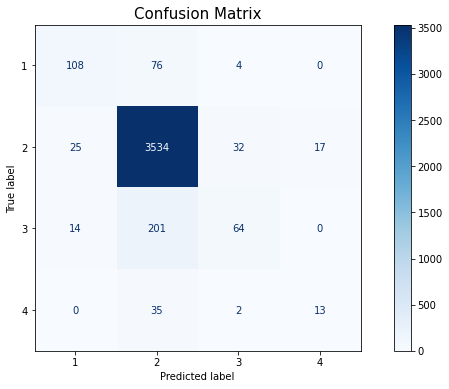

              precision    recall  f1-score   support

           1       0.73      0.57      0.64       188
           2       0.92      0.98      0.95      3608
           3       0.63      0.23      0.34       279
           4       0.43      0.26      0.33        50

    accuracy                           0.90      4125
   macro avg       0.68      0.51      0.56      4125
weighted avg       0.88      0.90      0.89      4125

balanced_accuracy: 0.510837197070729
roc_ovo_macro: 0.8330396540638936
roc_ovr_weighted: 0.9068550384211104


Weight,Feature
0.1879 ± 0.2731,Duration
0.1120 ± 0.2316,Start_Lat
0.1065 ± 0.0987,Month
0.0969 ± 0.2870,Start_Lng
0.0739 ± 0.1390,Pressure(in)
0.0688 ± 0.0693,Humidity(%)
0.0665 ± 0.0554,Hour
0.0543 ± 0.0597,Temperature(F)
0.0512 ± 0.1057,Week
0.0461 ± 0.0298,Traffic_Signal


In [153]:
# Gradient Boosting Classification
gbt_cla = GradientBoostingClassifier(learning_rate=0.1, max_depth=10, min_impurity_decrease=0.1, min_samples_leaf=2, n_estimators=100, random_state=0)
gbt_cla.fit(x_train_cla, y_train_cla)
gbt_cla_predictions = gbt_cla.predict(x_test_cla)
gbt_cla_results = classification_report(y_test_cla, gbt_cla_predictions, zero_division=True, output_dict=True)

# Confusion matrix and Classification report
draw_confusion_matrix(gbt_cla)
print(classification_report(y_test_cla, gbt_cla_predictions, zero_division=True))

# balanced_accuracy
gbt_cla_balanced_accuracy = balanced_accuracy_score(y_test_cla, gbt_cla_predictions)
print(f'balanced_accuracy: {gbt_cla_balanced_accuracy}')

# ROC_AUC score
gbt_cla_roc_ovo_macro = roc_auc_score(y_test_cla, gbt_cla.predict_proba(x_test_cla), multi_class='ovo', average='macro') #Insensitive to class imbalance when average == 'macro'
gbt_cla_roc_ovr_weighted = roc_auc_score(y_test_cla, gbt_cla.predict_proba(x_test_cla), multi_class='ovr', average='weighted') #Sensitive to class imbalance even when average == 'macro'
print(f"roc_ovo_macro: {gbt_cla_roc_ovo_macro}") 
print(f"roc_ovr_weighted: {gbt_cla_roc_ovr_weighted}")
# Show feature importance as a table
eli5.show_weights(gbt_cla, feature_names = cla_feature_names)

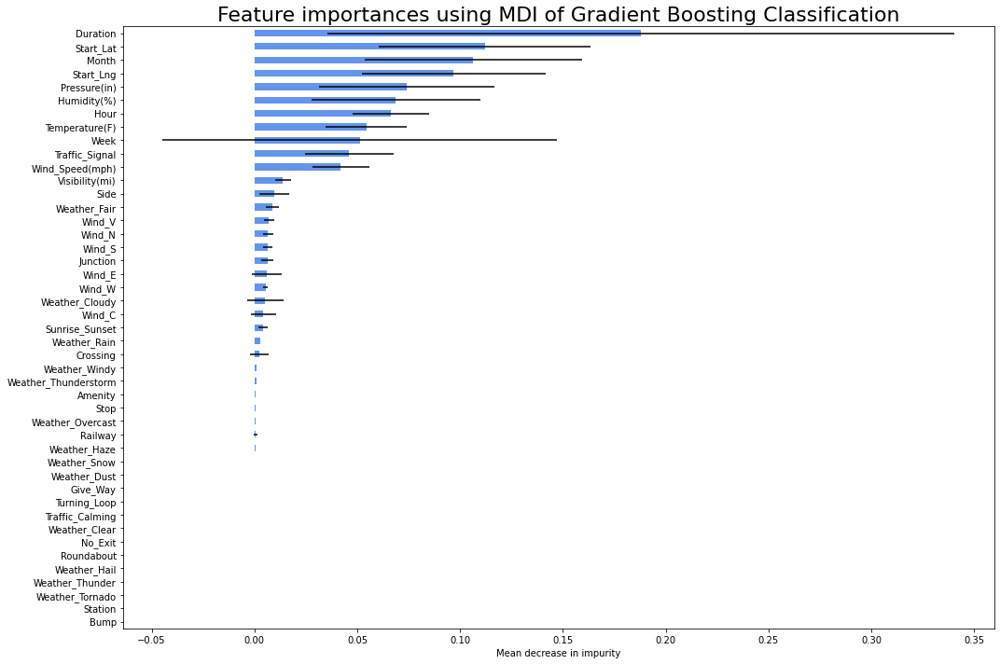

In [154]:
# Calculate Standard Deviation of each feature for all the trees
gbt_cla_importances_std = np.std([tree[0].feature_importances_ for tree in gbt_cla.estimators_], axis=0)
gbt_cla_importances = pd.Series(gbt_cla.feature_importances_, index=X_cla.columns)
gbt_cla_importances_df = pd.DataFrame(gbt_cla_importances, columns=['Importance'])
gbt_cla_importances_df['Std'] = gbt_cla_importances_std
gbt_cla_importances_df.sort_values('Importance', ascending=True, inplace=True)

fig, ax = plt.subplots(figsize=(15,10))
gbt_cla_importances_df['Importance'].plot.barh(xerr=gbt_cla_importances_df['Std'], color='cornflowerblue', ax=ax)
ax.set_title("Feature importances using MDI of Gradient Boosting Classification", fontsize = 22)
ax.set_xlabel("Mean decrease in impurity")
fig.tight_layout()

<a id="5.1.2.5"></a>
#### 5.1.2.5. Random Forest

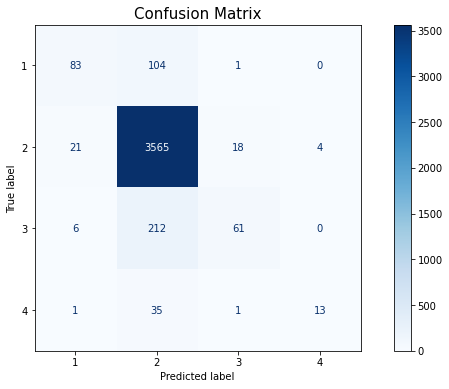

              precision    recall  f1-score   support

           1       0.75      0.44      0.56       188
           2       0.91      0.99      0.95      3608
           3       0.75      0.22      0.34       279
           4       0.76      0.26      0.39        50

    accuracy                           0.90      4125
   macro avg       0.79      0.48      0.56      4125
weighted avg       0.89      0.90      0.88      4125

balanced_accuracy: 0.47705234861124424
roc_ovo_macro: 0.8897577650394922
roc_ovr_weighted: 0.910892430380735


Weight,Feature
0.1109 ± 0.0373,Duration
0.1033 ± 0.0280,Start_Lat
0.0993 ± 0.0307,Start_Lng
0.0815 ± 0.0333,Month
0.0791 ± 0.0252,Pressure(in)
0.0787 ± 0.0224,Temperature(F)
0.0772 ± 0.0218,Humidity(%)
0.0721 ± 0.0215,Hour
0.0575 ± 0.0195,Wind_Speed(mph)
0.0516 ± 0.0192,Week


In [155]:
# Random Forest Classification
rf_cla = RandomForestClassifier(random_state=0)
rf_cla.fit(x_train_cla, y_train_cla)
rf_cla_predictions = rf_cla.predict(x_test_cla)
rf_cla_results = classification_report(y_test_cla, rf_cla_predictions, zero_division=True, output_dict=True)

# Confusion matrix and Classification report
draw_confusion_matrix(rf_cla)
print(classification_report(y_test_cla, rf_cla_predictions, zero_division=True))

# balanced_accuracy
rf_cla_balanced_accuracy = balanced_accuracy_score(y_test_cla, rf_cla_predictions)
print(f'balanced_accuracy: {rf_cla_balanced_accuracy}')

# ROC_AUC score
rf_cla_roc_ovo_macro = roc_auc_score(y_test_cla, rf_cla.predict_proba(x_test_cla), multi_class='ovo', average='macro') #Insensitive to class imbalance when average == 'macro'
rf_cla_roc_ovr_weighted = roc_auc_score(y_test_cla, rf_cla.predict_proba(x_test_cla), multi_class='ovr', average='weighted') #Sensitive to class imbalance even when average == 'macro'
print(f"roc_ovo_macro: {rf_cla_roc_ovo_macro}") 
print(f"roc_ovr_weighted: {rf_cla_roc_ovr_weighted}")
# Show feature importance as a table
eli5.show_weights(rf_cla, feature_names = cla_feature_names)

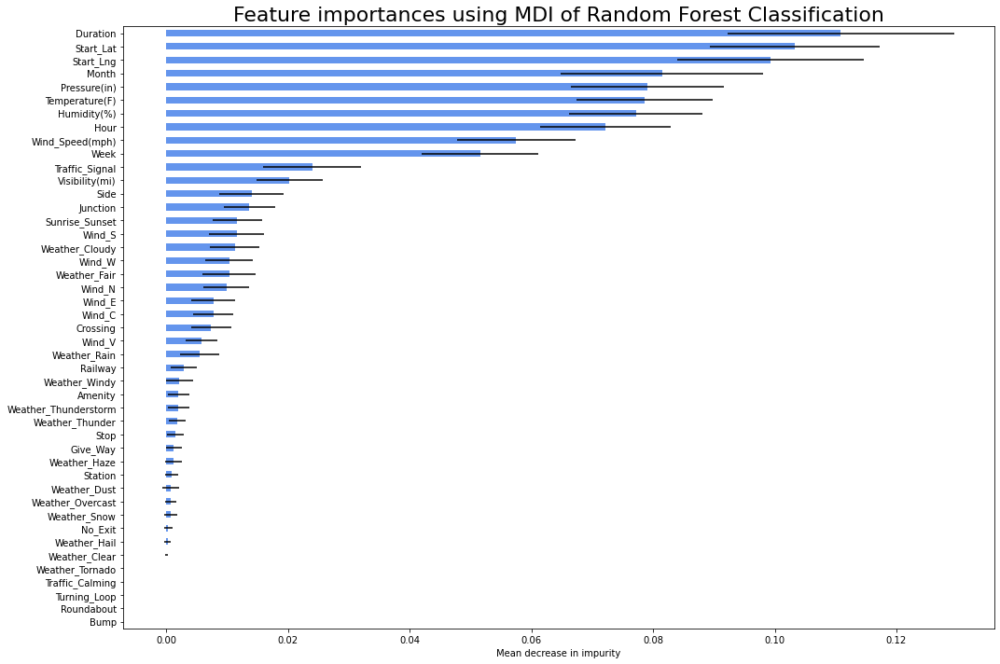

In [156]:
# Calculate Standard Deviation of each feature for all the trees
rf_cla_importances_std = np.std([tree.feature_importances_ for tree in rf_cla.estimators_], axis=0)
rf_cla_importances = pd.Series(rf_cla.feature_importances_, index=X_cla.columns)
rf_cla_importances_df = pd.DataFrame(rf_cla_importances, columns=['Importance'])
rf_cla_importances_df['Std'] = rf_cla_importances_std
rf_cla_importances_df.sort_values('Importance', ascending=True, inplace=True)

fig, ax = plt.subplots(figsize=(15,10))
rf_cla_importances_df['Importance'].plot.barh(xerr=rf_cla_importances_df['Std'], color='cornflowerblue', ax=ax)
ax.set_title("Feature importances using MDI of Random Forest Classification", fontsize = 22)
ax.set_xlabel("Mean decrease in impurity")
fig.tight_layout()

<a id="5.1.2.6"></a>
#### 5.1.2.6. XGBoost

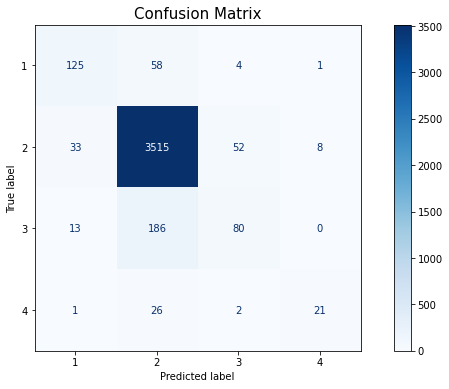

              precision    recall  f1-score   support

           1       0.73      0.66      0.69       188
           2       0.93      0.97      0.95      3608
           3       0.58      0.29      0.38       279
           4       0.70      0.42      0.53        50

    accuracy                           0.91      4125
   macro avg       0.73      0.59      0.64      4125
weighted avg       0.89      0.91      0.90      4125

balanced_accuracy: 0.5864639787651699
roc_ovo_macro: 0.871496232553084
roc_ovr_weighted: 0.9148482266513861


Weight,Feature
0.0932,Month
0.0822,Duration
0.0629,Traffic_Signal
0.0513,Wind_V
0.0425,Amenity
0.0405,Stop
0.0383,Week
0.0371,Weather_Overcast
0.0364,Weather_Thunder
0.0320,Side


In [157]:
# XGB Classification
xgb_cla = XGBClassifier(learning_rate=0.3, max_depth=20, n_estimators=100, eval_metric='mlogloss', random_state=0)
xgb_cla.fit(x_train_cla, y_train_cla)
xgb_cla_predictions = xgb_cla.predict(x_test_cla)
xgb_cla_results = classification_report(y_test_cla, xgb_cla_predictions, zero_division=True, output_dict=True)

# Confusion matrix and Classification report
draw_confusion_matrix(xgb_cla)
print(classification_report(y_test_cla, xgb_cla_predictions, zero_division=True))

# balanced_accuracy
xgb_cla_balanced_accuracy = balanced_accuracy_score(y_test_cla, xgb_cla_predictions)
print(f'balanced_accuracy: {xgb_cla_balanced_accuracy}')

# ROC_AUC score
xgb_cla_roc_ovo_macro = roc_auc_score(y_test_cla, xgb_cla.predict_proba(x_test_cla), multi_class='ovo', average='macro') #Insensitive to class imbalance when average == 'macro'
xgb_cla_roc_ovr_weighted = roc_auc_score(y_test_cla, xgb_cla.predict_proba(x_test_cla), multi_class='ovr', average='weighted') #Sensitive to class imbalance even when average == 'macro'
print(f"roc_ovo_macro: {xgb_cla_roc_ovo_macro}") 
print(f"roc_ovr_weighted: {xgb_cla_roc_ovr_weighted}")
# Show feature importance as a table
eli5.show_weights(xgb_cla, feature_names = cla_feature_names)

Text(0, 0.5, 'Features')

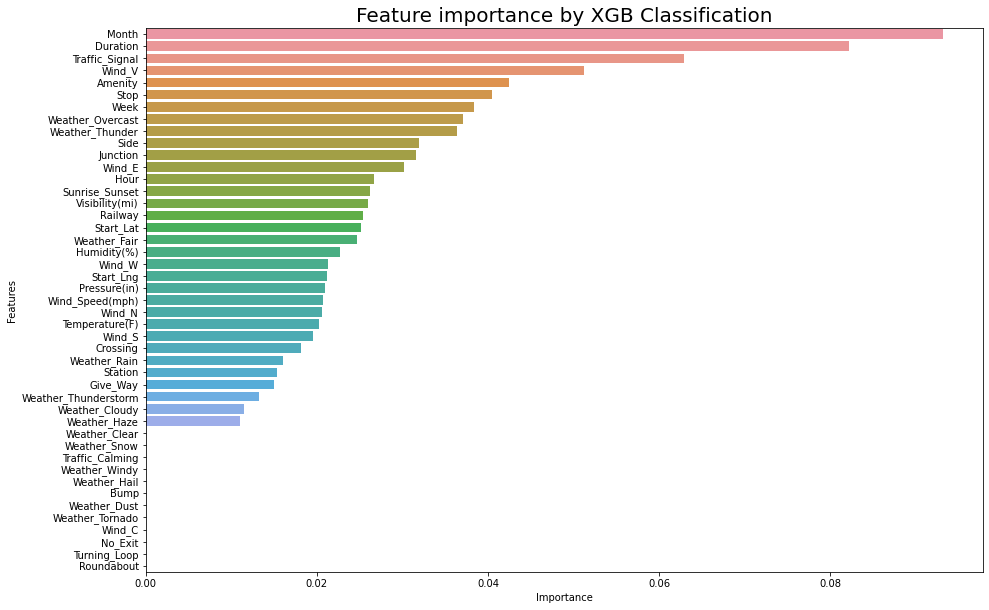

In [158]:
# Get the feature importance as a dataframe  
xgb_cla_importances_df = pd.DataFrame(pd.Series(xgb_cla.feature_importances_, index=X_cla.columns), columns=['Importance']).sort_values('Importance', ascending=False)
# Visualize the feature importance of the trained tree
plt.figure(figsize=(15, 10))
missing_value_graph = sns.barplot(y = xgb_cla_importances_df.index, x = "Importance", data=xgb_cla_importances_df, orient="h")
missing_value_graph.set_title("Feature importance by XGB Classification", fontsize = 20)
missing_value_graph.set_ylabel("Features")

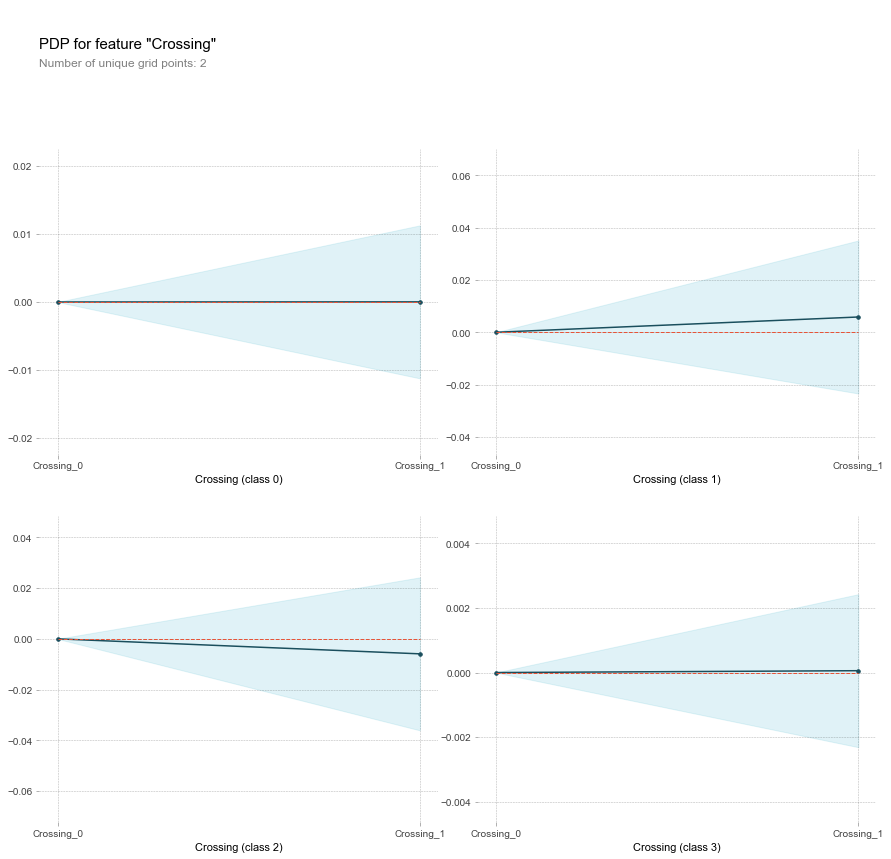

In [159]:
# 1-D pdp plot
xgb_cla_pdp_goals = pdp.pdp_isolate(model=xgb_cla, dataset=x_test_cla, model_features=cla_feature_names, feature='Crossing')
# plot it
pdp.pdp_plot(xgb_cla_pdp_goals, 'Crossing')
plt.show()

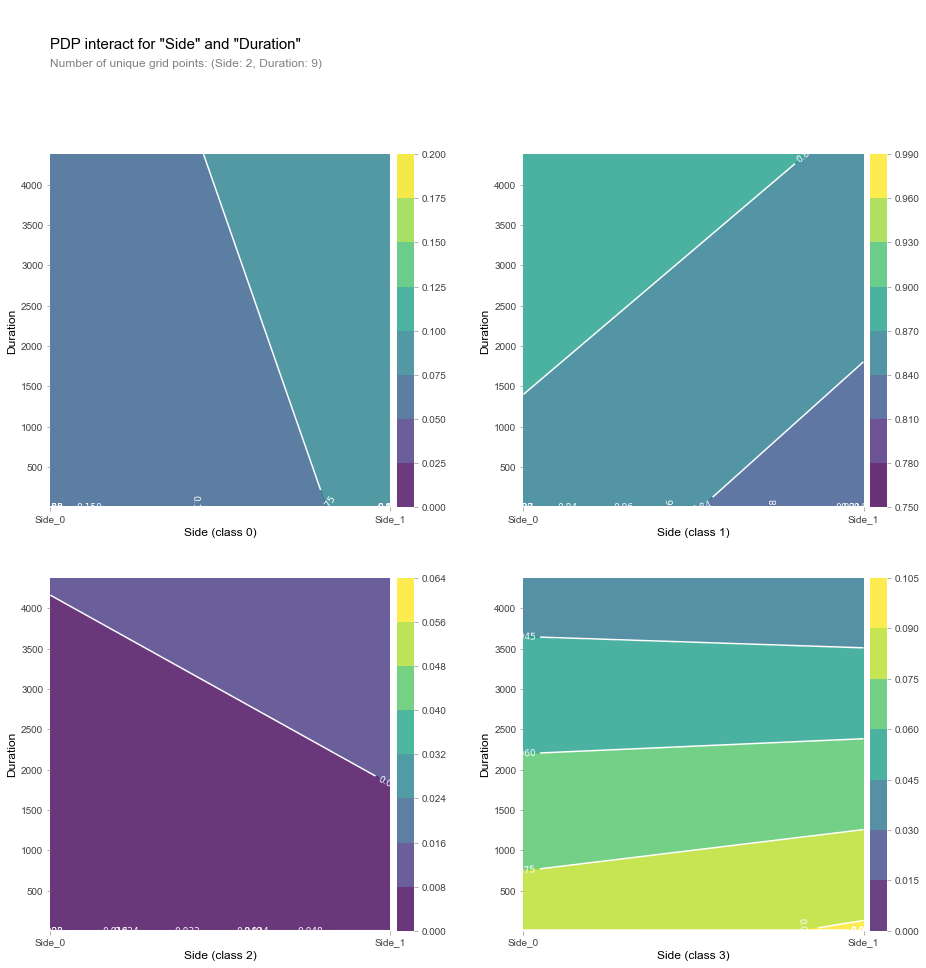

In [160]:
# 2D Partial Dependence Plots
features_to_plot = ['Side', 'Duration']
xgb_cla_pdp_2D = pdp.pdp_interact(model=xgb_cla, dataset=x_test_cla, model_features=cla_feature_names, features=features_to_plot)
pdp.pdp_interact_plot(pdp_interact_out=xgb_cla_pdp_2D, feature_names=features_to_plot, plot_type='contour')
plt.show()

<a id="5.1.2.8"></a>
#### 5.1.2.8. Model Comparison

In [177]:
# Gather all the classification performance in one table
cla_results = pd.DataFrame([
     
    (dt_cla_balanced_accuracy, dt_cla_results['accuracy'], dt_cla_results['weighted avg']['precision'], dt_cla_results['weighted avg']['recall'], dt_cla_results['weighted avg']['f1-score'], dt_cla_roc_ovo_macro, dt_cla_roc_ovr_weighted),
    (gbt_cla_balanced_accuracy, gbt_cla_results['accuracy'], gbt_cla_results['weighted avg']['precision'], gbt_cla_results['weighted avg']['recall'], gbt_cla_results['weighted avg']['f1-score'], gbt_cla_roc_ovo_macro, gbt_cla_roc_ovr_weighted),
    (rf_cla_balanced_accuracy, rf_cla_results['accuracy'], rf_cla_results['weighted avg']['precision'], rf_cla_results['weighted avg']['recall'], rf_cla_results['weighted avg']['f1-score'], rf_cla_roc_ovo_macro, rf_cla_roc_ovr_weighted),
    (xgb_cla_balanced_accuracy, xgb_cla_results['accuracy'], xgb_cla_results['weighted avg']['precision'], xgb_cla_results['weighted avg']['recall'], xgb_cla_results['weighted avg']['f1-score'], xgb_cla_roc_ovo_macro, xgb_cla_roc_ovr_weighted), 
    ], 
    columns=['Accuracy(Balanced)', 'Accuracy','Precision(Weighted_avg)', 'Recall(Weighted_avg)', 'F1-score(Weighted_avg)', 'Roc_ovo(macro)', 'Roc_ovr(weighted)'], 
    index= [
            'Decision Tree',
            'Gradient Boosting Tree',
            'Random Forest',
            'XGBoost',
            ])

cla_results.sort_values(by=['F1-score(Weighted_avg)'], ascending=False)

,Accuracy(Balanced),Accuracy,Precision(Weighted_avg),Recall(Weighted_avg),F1-score(Weighted_avg),Roc_ovo(macro),Roc_ovr(weighted)
XGBoost,0.586464,0.906909,0.893089,0.906909,0.895685,0.871496,0.914848
Gradient Boosting Tree,0.510837,0.901576,0.884886,0.901576,0.885421,0.833040,0.906855
Random Forest,0.477052,0.902303,0.890553,0.902303,0.881792,0.889758,0.910892
Decision Tree,0.540442,0.866909,0.868968,0.866909,0.867921,0.693471,0.729585


<a id="5.1.2.9"></a>
#### 5.1.2.9. Deal with Imbalanced data

In [163]:
# Form the train data for sampling
train_cla_df = pd.concat([x_train_cla, y_train_cla], axis=1)

# Over-sampling and Under-sampling 
size_l = len(train_cla_df[train_cla_df["Severity"]==2].index)
size_s = len(train_cla_df[train_cla_df["Severity"]==1].index)

train_cla_over = pd.DataFrame()
train_cla_under = pd.DataFrame()

for i in range(1,5):
    class_df = train_cla_df[train_cla_df["Severity"]==i]
    train_cla_over = train_cla_over.append(class_df.sample(size_l, random_state=1, replace=True))
    train_cla_under = train_cla_under.append(class_df.sample(size_s, random_state=1, replace=True))

print(f'Over-sampling: \n{train_cla_over.Severity.value_counts()}')
print(f'Under-sampling: \n{train_cla_under.Severity.value_counts()}')

Over-sampling: 
1    5411
2    5411
3    5411
4    5411
Name: Severity, dtype: int64
Under-sampling: 
1    282
2    282
3    282
4    282
Name: Severity, dtype: int64


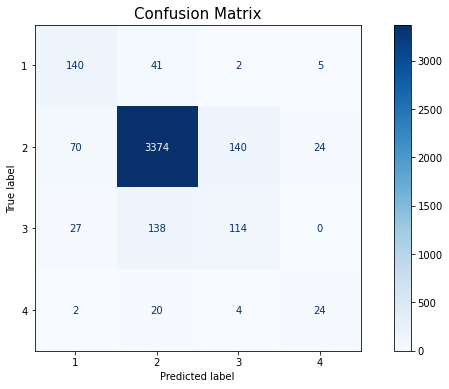

              precision    recall  f1-score   support

           1       0.59      0.74      0.66       188
           2       0.94      0.94      0.94      3608
           3       0.44      0.41      0.42       279
           4       0.45      0.48      0.47        50

    accuracy                           0.89      4125
   macro avg       0.61      0.64      0.62      4125
weighted avg       0.89      0.89      0.89      4125



In [164]:
# Try on over-sampling data
# XGB Classification
xgb_cla = XGBClassifier(learning_rate=0.3, max_depth=20, n_estimators=100, eval_metric='mlogloss', random_state=0)
xgb_cla.fit(train_cla_over.drop('Severity', axis=1), train_cla_over['Severity'])
xgb_cla_predictions_over = xgb_cla.predict(x_test_cla)

# Confusion matrix and Classification report
draw_confusion_matrix(xgb_cla)
print(classification_report(y_test_cla, xgb_cla_predictions_over, zero_division=True))

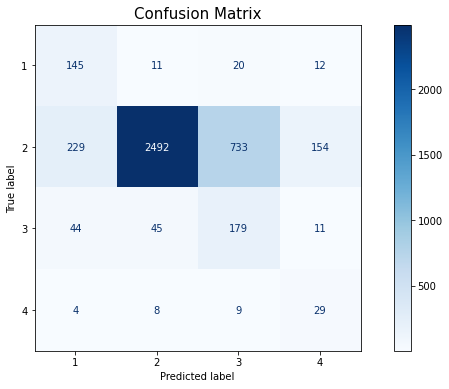

              precision    recall  f1-score   support

           1       0.34      0.77      0.48       188
           2       0.97      0.69      0.81      3608
           3       0.19      0.64      0.29       279
           4       0.14      0.58      0.23        50

    accuracy                           0.69      4125
   macro avg       0.41      0.67      0.45      4125
weighted avg       0.88      0.69      0.75      4125



In [165]:
# Try on under-sampling data
# XGB Classification
xgb_cla = XGBClassifier(learning_rate=0.3, max_depth=20, n_estimators=100, eval_metric='mlogloss', random_state=0)
xgb_cla.fit(train_cla_under.drop('Severity', axis=1), train_cla_under['Severity'])
xgb_cla_predictions_under = xgb_cla.predict(x_test_cla)

# Confusion matrix and Classification report
draw_confusion_matrix(xgb_cla)
print(classification_report(y_test_cla, xgb_cla_predictions_under, zero_division=True))

It seems Over-sampling and Under-sampling technique doesn't help to improve the model performance. Need to explore more methods.

<a id="5.1.2.10"></a>
#### 5.1.2.10. Severity Prediction Visualization

In [166]:
# Charlotte latitude and longitude values
# https://www.latlong.net/place/charlotte-nc-usa-1947.html
charlotte_lat = 35.2271
charlotte_long = -80.843124

# Generate a map of charlotte
charlotte_map = folium.Map(location=[charlotte_lat, charlotte_long], zoom_start=12)

# Instantiate a mark cluster object for the incidents in the dataframe
accidents = folium.plugins.MarkerCluster().add_to(charlotte_map)

# Loop through the dataframe and add each data point to the mark cluster
for lat, lng, label in zip(x_test_cla['Start_Lat'], x_test_cla['Start_Lng'], xgb_cla_predictions.astype(str)):
    if label == '4':
        folium.Marker(
            location=[lat, lng],
            icon=folium.Icon(color="red", icon="warning-sign"), #https://getbootstrap.com/docs/3.3/components/
            popup=label,
            ).add_to(accidents)
    elif label == '3':
        folium.Marker(
            location=[lat, lng],
            icon=folium.Icon(color="lightred", icon="warning-sign"),
            popup=label,
            ).add_to(accidents)
    elif label == '2':
        folium.Marker(
            location=[lat, lng],
            icon=folium.Icon(color="orange", icon="warning-sign"),
            popup=label,
            ).add_to(accidents)
    elif label == '1':
        folium.Marker(
            location=[lat, lng],
            icon=folium.Icon(color="beige", icon="warning-sign"),
            popup=label,
            ).add_to(accidents)
# Display map
charlotte_map

<a id="5.3"></a>
## 5.3. Severity Prediction

<a id="5.3.1"></a>
### 5.3.1 Parameter Tuning

In [167]:
# Decision Tree Classification
dtc_pipe = make_pipeline(DecisionTreeClassifier(random_state=0))
dtc_param = {
    'decisiontreeclassifier__max_depth': [5, 10, 20],
    'decisiontreeclassifier__min_samples_leaf': [2, 5, 10],
    'decisiontreeclassifier__min_impurity_decrease': [0.1, 0.2, 0.5]
}

dtc_search = GridSearchCV(dtc_pipe, 
                         dtc_param,
                         scoring="f1_weighted",
                         n_jobs=-1,
                         cv = 5)
dtc_search.fit(X_cla, Y_cla)
print(f'Best Params: {dtc_search.best_params_} \nBest score: {dtc_search.best_score_}')

Best Params: {'decisiontreeclassifier__max_depth': 5, 'decisiontreeclassifier__min_impurity_decrease': 0.1, 'decisiontreeclassifier__min_samples_leaf': 2} 
Best score: 0.8161116460040716


In [169]:
# Gradient Boosting Classification
gbtc_pipe = make_pipeline(GradientBoostingClassifier(random_state=0))
gbtc_param = {
    'gradientboostingclassifier__learning_rate': [0.1, 0.3, 0.7],
    'gradientboostingclassifier__max_depth': [5, 10, 20],
    'gradientboostingclassifier__n_estimators': [50, 100, 200],
    'gradientboostingclassifier__min_samples_leaf': [2, 5, 10],
    'gradientboostingclassifier__min_impurity_decrease': [0.1, 0.2, 0.5]
}

gbtc_search = GridSearchCV(gbtc_pipe, 
                         gbtc_param,
                         scoring="f1_weighted",
                         n_jobs=-1,
                         cv = 5)
gbtc_search.fit(X_cla, Y_cla)
print(f'Best Params: {gbtc_search.best_params_} \nBest score: {gbtc_search.best_score_}')

Best Params: {'gradientboostingclassifier__learning_rate': 0.3, 'gradientboostingclassifier__max_depth': 20, 'gradientboostingclassifier__min_impurity_decrease': 0.5, 'gradientboostingclassifier__min_samples_leaf': 2, 'gradientboostingclassifier__n_estimators': 50} 
Best score: 0.7733029627536956


In [170]:
# Random Forest Classification
rfc_pipe = make_pipeline(RandomForestClassifier(random_state=0))
rfc_param = {
    'randomforestclassifier__max_depth': [5, 10, 20],
    'randomforestclassifier__n_estimators': [50, 100, 200],
    'randomforestclassifier__min_impurity_decrease': [0.1, 0.2, 0.5],
    'randomforestclassifier__min_samples_leaf': [2, 5, 10],
}

rfc_search = GridSearchCV(rfc_pipe, 
                         rfc_param,
                         scoring="f1_weighted",
                         n_jobs=-1,
                         cv = 5)
rfc_search.fit(X_cla, Y_cla)
print(f'Best Params: {rfc_search.best_params_} \nBest score: {rfc_search.best_score_}')

Best Params: {'randomforestclassifier__max_depth': 5, 'randomforestclassifier__min_impurity_decrease': 0.1, 'randomforestclassifier__min_samples_leaf': 2, 'randomforestclassifier__n_estimators': 50} 
Best score: 0.8161116460040716


In [171]:
# XGB Classification
# https://xgboost.readthedocs.io/en/latest/tutorials/param_tuning.html
# https://stats.stackexchange.com/questions/243207/what-is-the-proper-usage-of-scale-pos-weight-in-xgboost-for-imbalanced-datasets
xgbc_pipe = make_pipeline(XGBClassifier(eval_metric='mlogloss', random_state=0))
xgbc_param = {
              'xgbclassifier__learning_rate': [0.1, 0.3, 0.7],
              'xgbclassifier__max_depth': [5, 10, 20],
              'xgbclassifier__n_estimators': [50, 100, 200],
              'xgbclassifier__scale_pos_weight': [5, 10, 30]}

xgbc_search = GridSearchCV(xgbc_pipe, 
                         xgbc_param,
                         scoring="f1_weighted",
                         n_jobs=-1,
                         cv = 5)
xgbc_search.fit(X_cla, Y_cla)
print(f'Best Params: {xgbc_search.best_params_} \nBest score: {xgbc_search.best_score_}')

[22:24:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "scale_pos_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


Best Params: {'xgbclassifier__learning_rate': 0.1, 'xgbclassifier__max_depth': 5, 'xgbclassifier__n_estimators': 50, 'xgbclassifier__scale_pos_weight': 5} 
Best score: 0.7752979277991813


<a id="5.3.2"></a>
### 5.3.2 Model Comparison

In [172]:
pd.DataFrame([ dtc_search.best_score_, gbtc_search.best_score_, rfc_search.best_score_, xgbc_search.best_score_], 
             columns=['F1-score'],
             index= ['Decision Tree',
                    'Gradient Boosting Tree',
                    'Random Forest',
                    'XGBoost'
                   ]).sort_values(by=['F1-score'], ascending=False)

,F1-score
Decision Tree,0.816112
Random Forest,0.816112
XGBoost,0.775298
Gradient Boosting Tree,0.773303


### Classification Results
#### Decision Tree
Best Params:  {'decisiontreeclassifier__max_depth': 5, 'decisiontreeclassifier__min_impurity_decrease': 0.2, 'decisiontreeclassifier__min_samples_leaf': 2} 
Best score: **0.816112**
#### Gradient Boosting Algorithm    
Best Params: {'gradientboostingclassifier__learning_rate': 0.3, 'gradientboostingclassifier__max_depth': 20, 'gradientboostingclassifier__min_impurity_decrease': 0.5, 'gradientboostingclassifier__min_samples_leaf': 2, 'gradientboostingclassifier__n_estimators': 50} 
Best score: **0.773303**
#### Random Forest Algorithm    
Best Params: {'randomforestclassifier__max_depth': 5, 'randomforestclassifier__min_impurity_decrease': 0.1, 'randomforestclassifier__min_samples_leaf': 2, 'randomforestclassifier__n_estimators': 50} 
Best score: **0.816112**
#### XGB Classifier
Best Params:{'xgbclassifier__learning_rate': 0.1, 'xgbclassifier__max_depth': 5, 'xgbclassifier__n_estimators': 50, 'xgbclassifier__scale_pos_weight': 5} 
Best score: **0.775298**

<a id="6"></a>

## 6. Conclusion

##### After performing Machine Learning models like, Random Forest, Decision Tree, XGB Classifier, Gradient Boosting algorithms on this dataset, we conclude that **XG Boost Algorithm** performs well with 90% of high positive accuracy rate.
##### Even after tuning the parameters of these algorithms, we got that, **Decision Tree and Random Forest Model**  gave us with 81% positive accuracy rate comparing to other. So, finally for this dataset, **XGBoost Model** is the best for Car Accident Severity Prediction. 

<a id="7"></a>

# 7. Model Explainability

### LIME

In [84]:
#Modelling Part
#Splitting the data
#Lightbgm-Extreme Gradient Boosting Method
X = data_modelling_df.drop(["Severity"],axis=1)
y = data_modelling_df["Severity"]
# spliting the data to train and validation set
# train and test data
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=101,stratify=y)
# shape of the data of train and validation set
print('Shape of the X_train {}'.format(X_train.shape))
print('Shape of the y_train {}'.format(y_train.shape))
print('Shape of the X_test {}'.format(X_test.shape))
print('Shape of the y_test {}'.format(y_test.shape))
#The shape of our data on train and validation. we will be using Lightgbm Algorithm to build our model.

Shape of the X_train (8079, 37)
Shape of the y_train (8079,)
Shape of the X_test (2693, 37)
Shape of the y_test (2693,)


In [85]:
#Using Lightgbm Algorithm-Extreme Gradient Boosting Method
params = {}
params["objective"] = "binary"
params['metric'] = 'auc_mu'
params["max_depth"] = -1
params["num_leaves"] = 10
params["min_data_in_leaf"] = 20
params["learning_rate"] = 0.03
params["bagging_fraction"] = 0.9
params["feature_fraction"] = 0.35
params["feature_fraction_seed"] = 20
params["bagging_freq"] = 10
params["bagging_seed"] = 30
params["'min_child_weight'"] = 0.01
params["lambda_l1"] = 0.01
params["verbosity"] = -1


In [86]:
from lightgbm import LGBMClassifier # intializing the model
model = LGBMClassifier(**params)
# fitting the model
model.fit(X_train, y_train)

[LightGBM] [Warning] min_child_weight is set=0.001, min_child_weight=0.01 will be ignored. Current value: min_child_weight=0.001
[LightGBM] [Warning] feature_fraction is set=0.35, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.35
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] lambda_l1 is set=0.01, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_freq is set=10, subsample_freq=0 will be ignored. Current value: bagging_freq=10


LGBMClassifier("'min_child_weight'"=0.01, bagging_fraction=0.9, bagging_freq=10,
               bagging_seed=30, feature_fraction=0.35, feature_fraction_seed=20,
               lambda_l1=0.01, learning_rate=0.03, metric='auc_mu',
               min_data_in_leaf=20, num_leaves=10, objective='binary',
               verbosity=-1)

In [87]:
pred = model.predict_proba(X_train)
pred
pred = pd.DataFrame(pred[:,1])
pred.head(10)
 

,0
0,0.987100
1,0.973316
2,0.989322
3,0.986046
4,0.985822
5,0.987593
6,0.988131
7,0.994213
8,0.987010
9,0.990157


In [88]:
y_train = pd.DataFrame(y_train)
y_train

,Severity
1134,2
2156,2
5164,2
378,2
2551,2
...,...
4746,2
10482,2
7998,2
3027,2


In [89]:
X_train.head()

,Start_Lat,Start_Lng,Side,Temperature(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Amenity,Crossing,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Sunrise_Sunset,Duration,Month,Week,Hour,Weather_Fair,Weather_Cloudy,Weather_Snow,Weather_Haze,Weather_Rain,Weather_Thunderstorm,Weather_Windy,Weather_Thunder,Wind_C,Wind_E,Wind_N,Wind_S,Wind_V,Wind_W
1134,28.355466,-81.239637,1,83.0,60.0,29.89,10.0,6.0,0,1,0,0,0,0,0,0,0,0,0,9.791667,10,1,13,0,1,0,0,0,0,0,0,0,0,1,0,0,0
2156,28.368061,-81.339007,1,78.0,60.0,29.88,10.0,10.0,0,0,0,0,0,0,0,0,0,0,0,5.597500,9,2,15,0,1,0,0,0,0,0,0,0,0,1,0,0,0
5164,28.567801,-81.207809,1,77.0,45.0,30.10,10.0,12.0,0,1,0,0,0,0,0,0,0,0,0,5.934444,11,1,13,1,0,0,0,0,0,0,0,0,0,1,0,0,0
378,28.489483,-81.458757,1,59.0,93.0,29.99,10.0,5.0,0,0,0,0,0,0,0,0,0,0,1,2.275000,12,5,5,0,1,0,0,0,0,0,0,0,0,1,0,0,0
2551,28.430379,-81.404783,1,82.0,74.0,29.91,10.0,7.0,0,0,0,0,0,0,0,0,0,0,0,36.551389,9,3,11,0,1,0,0,0,0,0,0,0,0,0,1,0,0


In [90]:
X_test.head()

,Start_Lat,Start_Lng,Side,Temperature(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Amenity,Crossing,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Sunrise_Sunset,Duration,Month,Week,Hour,Weather_Fair,Weather_Cloudy,Weather_Snow,Weather_Haze,Weather_Rain,Weather_Thunderstorm,Weather_Windy,Weather_Thunder,Wind_C,Wind_E,Wind_N,Wind_S,Wind_V,Wind_W
2334,28.482594,-81.330862,1,71.0,57.0,30.06,10.0,7.0,0,1,0,0,0,0,1,0,0,0,0,8.952500,12,5,15,0,1,0,0,0,0,0,0,0,1,0,0,0,0
9109,28.371530,-81.425670,1,84.0,61.0,29.97,10.0,7.0,0,0,0,0,0,0,0,0,0,0,0,0.500000,6,4,11,0,1,0,0,0,0,0,0,0,1,0,0,0,0
9239,28.536930,-81.375040,1,73.0,37.0,30.34,10.0,21.0,0,0,0,0,0,0,0,0,0,0,0,0.487778,3,6,13,0,1,0,0,0,0,1,0,0,1,0,0,0,0
617,28.565166,-81.207339,0,84.0,55.0,29.97,10.0,20.0,0,0,0,0,0,0,0,0,0,0,0,12.057500,9,1,13,0,1,0,0,0,0,0,0,0,1,0,0,0,0
9959,28.547080,-81.270170,1,83.0,46.0,29.86,10.0,17.0,0,0,0,0,0,0,0,0,0,0,0,0.488333,2,3,18,1,0,0,0,0,0,0,0,0,0,0,0,0,1


In [91]:
print(y_train.shape)
print(pred.shape)
print(y_test.shape)

(8079, 1)
(8079, 1)
(2693,)


In [92]:
# predicting the likelihood for the validation set
y_pred = model.predict_proba(X_test)[:, 1]
y_pred = pd.DataFrame(y_pred)
y_pred

,0
0,0.991329
1,0.742801
2,0.545205
3,0.992614
4,0.570852
...,...
2688,0.656544
2689,0.988044
2690,0.990723
2691,0.990287


In [93]:
#roc auc score
y_prob_pred = model.predict_proba(X_test)
ROC = roc_auc_score(y_test, y_prob_pred, multi_class='ovo', average='weighted')
# checking the roc_auc_curve
print('AUC score of the model is {}'.format(ROC))

AUC score of the model is 0.9495456584321436


In [94]:
import lime
from lime.lime_tabular import LimeTabularExplainer
#Prediction Class Names
class_names = [0,1]
#instantiate the explanations for the data set
k=5
#LIME Explainer
limeexplainer = lime.lime_tabular.LimeTabularExplainer(X_test.values,class_names=class_names, feature_names = X_test.columns, discretize_continuous = True)
idx=100 # the rows of the dataset
explainable_exp = limeexplainer.explain_instance(X_test.values[idx], model.predict_proba, num_features=k, labels=class_names)
explainable_exp.show_in_notebook(show_table=True)